# Sunny - Fine-tuning MedGemma-1.5 for skin and sunscreeen extraction

In this notebook we are going to fine-tune MedGemma-1.5 for strutured skin and sunscreen photo extraction to create ☀️ Sunny-MedGemma.

* **Inputs:** Photo of sunscreen or skin + simple text prompt, e.g. `'skin extract'`.
* **Outputs:** Structured JSON data ready to be displayed in the Sunny app.

## Setup

* Setting up `HF_TOKEN` in Google Colab secrets. See here for demo: https://www.learnhuggingface.com/extras/setup
* Setting up GPU: Runtime -> A100 (works best with more VRAM, e.g. 80GB) -> Change runtime
* Accept the MedGemma license at https://huggingface.co/google/medgemma-1.5-4b-it

## Resources

* All code and resources on GitHub: https://github.com/mrdbourke/sunny
* Dataset for fine-tuning: https://huggingface.co/datasets/mrdbourke/sunny-skin-and-sunscreen-extract-1k
* Base model: https://huggingface.co/google/medgemma-1.5-4b-it (go here and click "Accept" to enable model download)
* Fine-tuning code is based on: https://www.learnhuggingface.com/notebooks/hugging_face_vlm_fine_tune_tutorial

## Details

We fully fine-tune the LLM part of MedGemma-1.5-4B with the vision part frozen (as described in the [SmolDocling paper](https://arxiv.org/abs/2503.11576)) in a Supervised Fine-tuning (SFT) fashion.

Our goal is to fine-tune the model so it can run on-device with minimal input text prompting (when working on small devices, every token counts, so if we can reduce the tokens required for a specific output, then we will endeavour to do so).

We want it to output structured data given an input image of sunscreen or skin.

Below we can see an example extraction of visual information from a photo of skin.

This will be what we will be trying to fine-tune MedGemma-1.5 to do.

![Example of desired extraction from a photo of skin for MedGemma-1.5 to perform](https://github.com/mrdbourke/sunny/blob/main/images/sunny-example-skin-extract.png?raw=true)

*Sample ID `ISIC_3498683` from [ISIC 2024 dataset](https://challenge2024.isic-archive.com/), label generated by Gemini 3 Flash.*

## Install dependencies

We use the following:

* `transformers` - Allows access to base MedGemma-1.5-4B model (make sure you authenticate on HF to get access to the model).
* `trl` - Transformers Reinforcement Learning, allows us to fine-tune the base model.
* `datasets` - Allows us to access our custom made dataset.
* `accelerate` - Handles device placement for training/inference.
* `huggingface_hub` - Allows us to authenticate to the Hugging Face Hub and upload/download models.

In [1]:
!pip install -U pillow
!pip install -U transformers
!pip install -U trl
!pip install -U datasets
!pip install -U accelerate
!pip install -U huggingface_hub

## Authenticate Hugging Face Hub

In [2]:
from huggingface_hub import login
import os

# Option A: If running in Google Colab with Secrets
try:
    from google.colab import userdata
    hf_token = userdata.get("HF_TOKEN")
    login(token=hf_token)
    print("[INFO] Logged in via Colab Secrets.")
except Exception:
    # Option B: Manual login (will prompt for token)
    if not os.environ.get("HF_TOKEN"):
        login()
        print("[INFO] Logged in via manual prompt.")
    else:
        login(token=os.environ["HF_TOKEN"])
        print("[INFO] Logged in via HF_TOKEN environment variable.")

[INFO] Logged in via Colab Secrets.


## Imports

In [3]:
import torch
import json
import random

from pprint import pprint
from datasets import load_dataset

from PIL import Image
from transformers import AutoProcessor, AutoModelForImageTextToText
from trl import SFTConfig, SFTTrainer

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"[INFO] Using device: {device}")
if device == "cuda":
    print(f"[INFO] GPU: {torch.cuda.get_device_name(0)}")
    print(f"[INFO] GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

[INFO] Using device: cuda
[INFO] GPU: NVIDIA A100-SXM4-80GB
[INFO] GPU Memory: 85.1 GB


## Load Dataset

Load the dataset from Hugging Face and inspect a couple of samples.

See the dataset and details of how it was created here: https://huggingface.co/datasets/mrdbourke/sunny-skin-and-sunscreen-extract-1k

In [4]:
dataset = load_dataset("mrdbourke/sunny-skin-and-sunscreen-extract-1k")
print(f"[INFO] Dataset loaded:")
print(dataset)
print(f"\n[INFO] Train features: {dataset['train'].features}")
print(f"[INFO] Example sample keys: {list(dataset['train'][0].keys())}")

# Look at an example
example = dataset["train"][0]
print(f"\n[INFO] Example input_prompt:\n{example['input_prompt']}")
print(f"\n[INFO] Example output:")
json.loads(str(example['output']))

README.md:   0%|          | 0.00/8.17k [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/181M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/24.5M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/987 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/110 [00:00<?, ? examples/s]

[INFO] Dataset loaded:
DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'input_prompt', 'output', 'source'],
        num_rows: 987
    })
    test: Dataset({
        features: ['image', 'image_id', 'input_prompt', 'output', 'source'],
        num_rows: 110
    })
})

[INFO] Train features: {'image': Image(mode=None, decode=True), 'image_id': Value('string'), 'input_prompt': Value('string'), 'output': Value('string'), 'source': Value('string')}
[INFO] Example sample keys: ['image', 'image_id', 'input_prompt', 'output', 'source']

[INFO] Example input_prompt:
skin extract

[INFO] Example output:


{'lesion_type': 'Multiple small pigmented spots or macules.',
 'color': 'Varied shades of medium to dark brown.',
 'symmetry': 'Asymmetrical in both the shape of individual spots and their overall arrangement.',
 'borders': 'Irregular and poorly defined margins.',
 'texture': 'Undetermined due to image resolution or focus.',
 'summary': 'The area shows a cluster of small, dark brown spots with irregular shapes and poorly defined edges.'}

We can also view a couple of samples with a nice HTML card.

In [5]:
from IPython.display import display, HTML
import json
import base64
from io import BytesIO


def display_sample(sample, idx: int = None):
    """Display a single dataset sample as an HTML card.

    Args:
        sample: A dataset row with keys: image, input_prompt, output, image_id, etc.
        idx: Optional dataset index to show in the card title.
    """
    buf = BytesIO()
    sample["image"].save(buf, format="PNG")
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    def fmt(text):
        try:
            obj = json.loads(str(text))
            return json.dumps(obj, indent=2)
        except (json.JSONDecodeError, TypeError):
            return str(text)

    output_fmt = fmt(sample["output"])

    title = f"Sample {idx}" if idx is not None else "Sample"

    meta_parts = []
    if idx is not None:
        meta_parts.append(f"idx: <strong>{idx}</strong>")
    if "image_id" in sample and sample["image_id"] is not None:
        meta_parts.append(f"image_id: <strong>{sample['image_id']}</strong>")
    meta_html = f'<p style="margin:0 0 12px 0; font-size:13px; color:#555;">{" &nbsp;|&nbsp; ".join(meta_parts)}</p>' if meta_parts else ""

    html = f"""
    <div style="border:1px solid #ccc; padding:16px; margin:12px 0; font-family:monospace; max-width:1200px;">
        <h3 style="margin:0 0 4px 0; font-size:16px;">{title}</h3>
        <p style="margin:0 0 4px 0; font-size:13px; color:#555;">Prompt: <strong>{sample['input_prompt']}</strong></p>
        {meta_html}
        <div style="text-align:center; margin-bottom:12px;">
            <img src="data:image/png;base64,{img_b64}" style="max-width:300px; border:1px solid #ddd;" />
        </div>
        <div>
            <h4 style="margin:0 0 6px 0; font-size:14px;">Desired Output</h4>
            <pre style="background:#f9f9f9; border:1px solid #ddd; padding:10px; font-size:12px; overflow-x:auto; white-space:pre-wrap; word-break:break-word;">{output_fmt}</pre>
        </div>
    </div>
    """
    display(HTML(html))

Let's look at a skin example first.


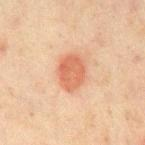

In [6]:
# Skin extract
display_sample(dataset["train"][585], idx=585)

And a sunscreen extraction sample.


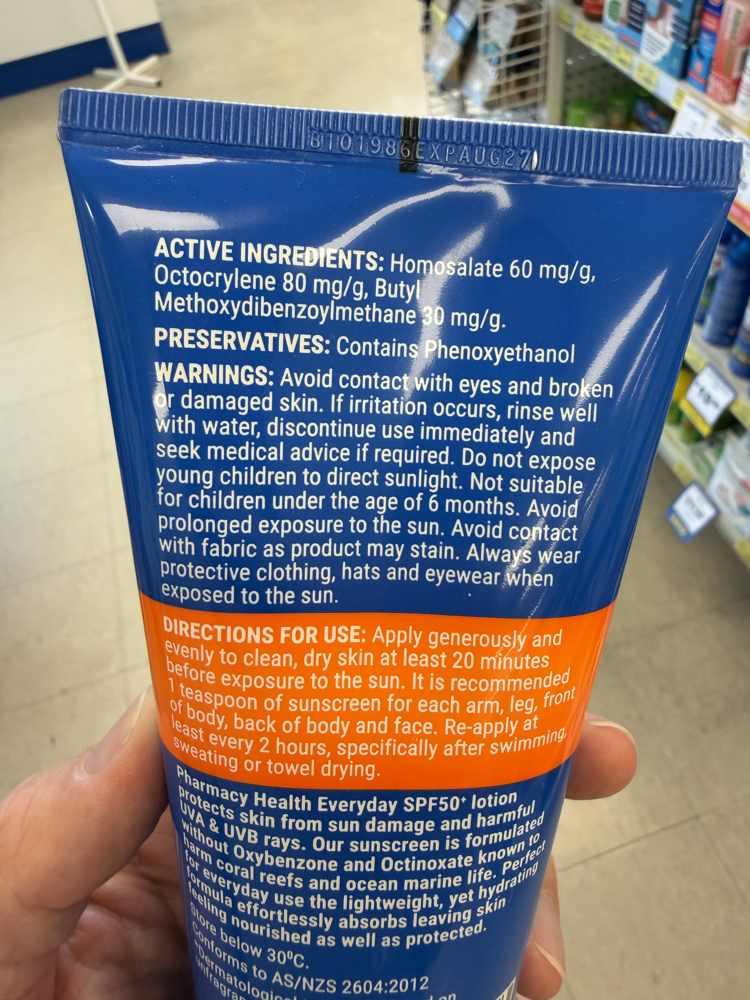

In [7]:
# Sunscreen extract
display_sample(dataset["train"][768], idx=768)

## Format data for VLM fine-tuning

MedGemma uses the [Gemma 3 chat template format](https://ai.google.dev/gemma/docs/core/huggingface_inference#use_a_prompt_template).

For example:

```
messages = [
    [
        {
            "role": "system",
            "content": [{"type": "text", "text": "You are a helpful assistant."},]
        },
        {
            "role": "user",
            "content": [{"type": "text", "text": "Roses are red..."},]
        },
    ],
]

medgemma_model(messages)
```

`system` is the model and `user` is the person inputting something.

We can now format our samples to take our dataset and turn them into message-style.

We want to pass our model an image and a short snippet of text such as `'sunscreen extract'` or `'skin extract'`.

Given this input, we'd like our model to produce a structured output such as we've seen above.

Let's write a helper function to convert our data samples into message-style inputs.

In [8]:
def format_data(sample):
    """Convert a dataset sample to the conversational message format."""

    # Ensure output is a string
    output_text = sample["output"]
    if isinstance(output_text, dict):
        output_text = json.dumps(output_text)
    elif not isinstance(output_text, str):
        output_text = str(output_text)

    return {
        "messages": [
            # [USER] Image + prompt
            {
                "role": "user",
                "content": [
                    {
                        "type": "image",
                        "image": sample["image"],
                    },
                    {
                        "type": "text",
                        "text": sample["input_prompt"],
                    }
                ],
            },
            # [ASSISTANT] Desired model output
            {
                "role": "assistant",
                "content": [
                    {
                        "type": "text",
                        "text": output_text,
                    }
                ],
            }
        ]
    }

# Format all samples (using list comprehension to avoid .map() issues with PIL images)
print("[INFO] Formatting training data...")
train_dataset = [format_data(sample) for sample in dataset["train"]]
print(f"[INFO] Formatted {len(train_dataset)} training samples.")

print("[INFO] Formatting test data...")
test_dataset = [format_data(sample) for sample in dataset["test"]]
print(f"[INFO] Formatted {len(test_dataset)} test samples.")

# Create a validation split from the test set
val_dataset = test_dataset  # Use the test split as validation during training

print(f"\n[INFO] Train samples: {len(train_dataset)}")
print(f"[INFO] Validation samples: {len(val_dataset)}")

[INFO] Formatting training data...
[INFO] Formatted 987 training samples.
[INFO] Formatting test data...
[INFO] Formatted 110 test samples.

[INFO] Train samples: 987
[INFO] Validation samples: 110


Now we've formatted our samples, let's inspect one.

In [9]:
# Inspect a formatted sample
print(f"\n[INFO] Example formatted sample (messages structure):")
example_formatted = train_dataset[0]
for i, msg in enumerate(example_formatted["messages"]):
    role = msg["role"]
    content_types = [c["type"] for c in msg["content"]]
    print(f"\tMessage {i} [{role}]: content types = {content_types}")
    for content in msg["content"]:
        if content["type"] == "text":
          if role == "user":
            print(f"\t\tModel input: <user_image> + '{content['text'][:100]}'")
          else:
            print(f"\t\tModel text output: {content['text'][:100]}")


[INFO] Example formatted sample (messages structure):
	Message 0 [user]: content types = ['image', 'text']
		Model input: <user_image> + 'skin extract'
	Message 1 [assistant]: content types = ['text']
		Model text output: {"lesion_type": "Multiple small pigmented spots or macules.", "color": "Varied shades of medium to d


## Load the base model and processor

Now we've got our data formatted, let's load the base MedGemma-1.5 model and its processor.

In [10]:
MODEL_ID = "google/medgemma-1.5-4b-it"
print(f"[INFO] Loading model: {MODEL_ID}")

model = AutoModelForImageTextToText.from_pretrained(
    MODEL_ID,
    attn_implementation="eager",  # Use "flash_attention_2" if flash-attn is installed for speed
    dtype=torch.bfloat16,
    device_map="auto",
)
processor = AutoProcessor.from_pretrained(MODEL_ID)

# Set padding side for training
# 'right' = padding appears on the right side of text, e.g. "this is some text <pad><pad><pad>"
processor.tokenizer.padding_side = "right"

print(f"[INFO] Model loaded successfully.")
print(f"[INFO] Model type: {type(model).__name__}")

[INFO] Loading model: google/medgemma-1.5-4b-it


config.json:   0%|          | 0.00/2.55k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/115 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/70.0 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.53k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

The image processor of type `Gemma3ImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

[INFO] Model loaded successfully.
[INFO] Model type: Gemma3ForConditionalGeneration


## Freeze the vision tower

As the MedGemma model has been already been trained on many different medical images, we're going to keep the vision tower (located at `model.vision_tower`) frozen.

Our main goal is to fine-tune the LLM part (located at `model.language_model`) to adhere to our desired outputs.

The freezing of the vision tower is inline with [SmolDocling paper](https://arxiv.org/abs/2503.11576).

In [11]:
def count_parameters(model):
    """Count parameters for each top-level component of model."""
    print(f"{'Component':<30} {'Params':>15} {'Size (MB)':>10} {'Trainable':>13} {'% Trainable':>13}")
    print("-" * 85)

    total = 0
    total_trainable = 0

    for name, module in model.model.named_children():
        params = sum(p.numel() for p in module.parameters())
        trainable = sum(p.numel() for p in module.parameters() if p.requires_grad)
        size_mb = params * 2 / 1024**2  # assuming bf16/fp16
        pct_trainable = (trainable / params * 100) if params > 0 else 0.0
        total += params
        total_trainable += trainable
        print(f"{name:<30} {params:>15,} {size_mb:>9.1f}M {trainable:>13,} {pct_trainable:>12.1f}%")

    print("-" * 85)
    total_mb = total * 2 / 1024**2
    total_pct = (total_trainable / total * 100) if total > 0 else 0.0
    print(f"{'TOTAL':<30} {total:>15,} {total_mb:>9.1f}M {total_trainable:>13,} {total_pct:>12.1f}%")

# Before freezing
print(f"[INFO] BEFORE freezing vision tower:\n")
count_parameters(model)

# Freeze the vision tower
for param in model.model.vision_tower.parameters():
    param.requires_grad = False

# After freezing
print(f"\n\n[INFO] AFTER freezing vision tower:\n")
count_parameters(model)

[INFO] BEFORE freezing vision tower:

Component                               Params  Size (MB)     Trainable   % Trainable
-------------------------------------------------------------------------------------
vision_tower                       416,866,032     795.1M   416,866,032        100.0%
multi_modal_projector                2,950,272       5.6M     2,950,272        100.0%
language_model                   3,880,263,168    7401.0M 3,880,263,168        100.0%
-------------------------------------------------------------------------------------
TOTAL                            4,300,079,472    8201.8M 4,300,079,472        100.0%


[INFO] AFTER freezing vision tower:

Component                               Params  Size (MB)     Trainable   % Trainable
-------------------------------------------------------------------------------------
vision_tower                       416,866,032     795.1M             0          0.0%
multi_modal_projector                2,950,272       5.6M     2

## Test the base model on an example

Before we fine-tune the model, let's test it on an example.

This will give us a way to compare what the models outputs look like before and after fine-tuning.

In [12]:
print("[INFO] BASE MODEL INFERENCE (before fine-tuning)")

# Get an example input (only the user message, not the assistant response)
example_input_messages = train_dataset[0]["messages"][:1]  # Just the user message

print(f"[INFO] Input message:\n{example_input_messages}\n")

# Apply chat template
example_inputs = processor.apply_chat_template(
    example_input_messages,
    add_generation_prompt=True,
    tokenize=True,
    return_dict=True,
    return_tensors="pt",
).to(device)

input_len = example_inputs["input_ids"].shape[-1]
print(f"[INFO] Input length: {input_len} tokens")

# Generate
with torch.no_grad():
    output_ids = model.generate(
        **example_inputs,
        max_new_tokens=256,
        do_sample=False,
    )
    generated_ids = output_ids[0][input_len:]

base_model_output = processor.decode(generated_ids, skip_special_tokens=True)
desired_output = train_dataset[0]["messages"][-1]["content"][0]["text"]

print(f"\n[INFO] Base model output:\n{base_model_output}")
print(f"\n[INFO] Desired output:\n")
json.loads(desired_output)

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] BASE MODEL INFERENCE (before fine-tuning)
[INFO] Input message:
[{'role': 'user', 'content': [{'type': 'image', 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=131x131 at 0x79631E5B34A0>}, {'type': 'text', 'text': 'skin extract'}]}]

[INFO] Input length: 270 tokens

[INFO] Base model output:
Based on the image, it appears to show a skin lesion. It is difficult to determine the exact nature of the lesion without a proper medical examination.

If you are concerned about a skin lesion, it is important to consult a dermatologist or other qualified healthcare professional for an accurate diagnosis and appropriate treatment. They can examine the lesion, potentially perform a biopsy if necessary, and provide you with the best course of action.


[INFO] Desired output:



{'lesion_type': 'Multiple small pigmented spots or macules.',
 'color': 'Varied shades of medium to dark brown.',
 'symmetry': 'Asymmetrical in both the shape of individual spots and their overall arrangement.',
 'borders': 'Irregular and poorly defined margins.',
 'texture': 'Undetermined due to image resolution or focus.',
 'summary': 'The area shows a cluster of small, dark brown spots with irregular shapes and poorly defined edges.'}

It seems our model is outputting a simple description of the skin lesion rather than extracting the type of outputs we'd like.

We could upgrade our base model's output with better prompting or we can fine-tune this workflow towards the desired output directly into the model.

Because we're going to be running the model on an edge device (e.g. a mobile phone), we'll fine-tune the functionality directly into the model so we don't have to spend extra memory on a sophisticated input prompt.

TK image - make an image of the base model's example input/output and our desired input/output

## Create a data collator

Let's create a data collator to preprocess batches of image and text pairs for training.

The data collator function (`collate_fn`) handles:

* Extracting images from the message format.
* Applying the chat template to images and texts.
* Tokenizing text and preprocessing images.
* Creating labels with proper masking (we mask the image tokens as we don't want the LLM to predict these rather *use* them to predict the text).

In [13]:
def extract_images_from_messages(messages):
    """Extract PIL images from conversational messages."""
    images = []
    for msg in messages:
        content = msg.get("content", [])
        if not isinstance(content, list):
            content = [content]
        for element in content:
            if isinstance(element, dict):
                if "image" in element:
                    img = element["image"]
                    if isinstance(img, Image.Image):
                        images.append(img.convert("RGB"))
                elif element.get("type") == "image" and "image" in element:
                    img = element["image"]
                    if isinstance(img, Image.Image):
                        images.append(img.convert("RGB"))
    return images

def collate_fn(examples):
    """Collate function to batch image+text pairs for training."""
    texts = []
    images = []

    for example in examples:
        # Extract images from messages
        image_list = extract_images_from_messages(example["messages"])

        # Apply chat template (returns text with special tokens)
        text = processor.apply_chat_template(
            example["messages"],
            add_generation_prompt=False,
            tokenize=False,
        )
        texts.append(text.strip())
        images.append(image_list)

    # Process the batch through the processor
    batch = processor(
        text=texts,
        images=images,
        return_tensors="pt",
        padding=True,
    )

    # Create labels: clone input_ids and mask tokens we don't want loss on
    labels = batch["input_ids"].clone()

    # Mask padding tokens
    labels[labels == processor.tokenizer.pad_token_id] = -100

    # Mask image placeholder tokens (these are filled by the vision encoder,
    # we don't want the LM to learn to predict them)
    # For Gemma 3 / MedGemma, the image soft token is a special token
    if hasattr(processor, "image_token_id"):
        image_token_id = processor.image_token_id
    elif hasattr(processor.tokenizer, "additional_special_tokens"):
        # Try to find image token in special tokens
        for token_str in ["<image_soft_token>", "<image>"]:
            if token_str in processor.tokenizer.additional_special_tokens:
                idx = processor.tokenizer.additional_special_tokens.index(token_str)
                image_token_id = processor.tokenizer.additional_special_tokens_ids[idx]
                break
        else:
            # Fallback: try converting the token directly
            image_token_id = processor.tokenizer.convert_tokens_to_ids("<image_soft_token>")
    else:
        image_token_id = None

    if image_token_id is not None and image_token_id != processor.tokenizer.unk_token_id:
        labels[labels == image_token_id] = -100
        print(f"[collate_fn] Masking image token ID: {image_token_id}") if not hasattr(collate_fn, "_logged") else None
        collate_fn._logged = True

    batch["labels"] = labels
    return batch

# Quick test of the collate function
print("[INFO] Testing collate_fn with a single sample...")
test_batch_sample = collate_fn([train_dataset[0]])
print(f"\tinput_ids shape: {test_batch_sample['input_ids'].shape}")
print(f"\tlabels shape: {test_batch_sample['labels'].shape}")
if "pixel_values" in test_batch_sample:
    print(f"\tpixel_values shape: {test_batch_sample['pixel_values'].shape}")
print(f"\tNumber of masked tokens in labels: {(test_batch_sample['labels'] == -100).sum().item()}")
print(f"[INFO] Full sample (notice token `262144` is the image token):")
test_batch_sample

[INFO] Testing collate_fn with a single sample...
[collate_fn] Masking image token ID: 262144
	input_ids shape: torch.Size([1, 366])
	labels shape: torch.Size([1, 366])
	pixel_values shape: torch.Size([1, 3, 896, 896])
	Number of masked tokens in labels: 256
[INFO] Full sample (notice token `262144` is the image token):


{'input_ids': tensor([[     2,      2,    105,   2364,    109, 255999, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144, 262144,
         26214

## Setup SFTConfig for training

We're going to fine-tune our model in a Supervised Fine-tuning fashion.

This means we're giving it input examples (image + text pairs) as well as output examples (structured texts).

The following hyperparameters have been set with the use of a single A100 80GB GPU via Google Colab.

Since we are fully fine-tuning the LLM part of the model, we require a large amount of memory.

If you don't have access to a GPU with ~40GB+ of memory, it is recommended to try using [QLoRA instead](https://ai.google.dev/gemma/docs/core/huggingface_text_finetune_qlora).

Other things you can try to mitigate GPU memory usage:

* Lower `batch_size` - this lowers the number of samples on the GPU at the same time
* Increase `grad_accum` - this *accumulates* the gradient updates for a number of steps

You can see the full settings for [`trl.SFTConfig`](https://huggingface.co/docs/trl/en/sft_trainer#trl.SFTConfig) in the documentation.

> **Note:** These hyperparameters work quite well for our given problem, however, there may be a series of values which are *better performing*. I'll leave this as an extension to potentially find a set of hyperparameters which result in better outputs.

In [14]:
OUTPUT_DIR = "medgemma-1.5-4b-sunny-skin-finetune"

training_args = SFTConfig(
    output_dir=OUTPUT_DIR,

    # Training duration
    num_train_epochs=3, # Because of its vast pretraining, we don't need too many epochs to our model to perform how we'd like

    # Batch size & accumulation
    per_device_train_batch_size=2, # Adjust based on GPU memory
    per_device_eval_batch_size=2,
    gradient_accumulation_steps=8, # Effective batch size = 2 * 8 = 16

    # Memory optimization
    gradient_checkpointing=True,
    gradient_checkpointing_kwargs={"use_reentrant": False},

    # Optimizer
    optim="adamw_torch_fused",
    learning_rate=2e-5, # Lower LR for larger model
    max_grad_norm=1.0,
    #warmup_ratio=0.03, # Note: warmup_ratio is deprecated and will be removed, use `warmup_steps` instead
    warmup_steps=5, # total_steps = (num_samples // (batch_size * gradient_accumulation_steps)) * num_epochs, we'll use 3% of steps for warmup, 0.03 * 183 (num total steps) = 5
    lr_scheduler_type="cosine",

    # Precision
    bf16=True,

    # Logging & saving
    logging_strategy="epoch",
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    load_best_model_at_end=True,

    # Hub
    push_to_hub=False, # We could push our model straight to the hub after training if we like
    report_to="none", # Optional: track experiments with trackio or Weights & Biases

    # Dataset handling (important for custom collate)
    dataset_text_field="",
    dataset_kwargs={"skip_prepare_dataset": True},
    remove_unused_columns=False,
)

print(f"[INFO] Training config:")
print(f"Output dir: {OUTPUT_DIR}")
print(f"Epochs: {training_args.num_train_epochs}")
print(f"Batch size: {training_args.per_device_train_batch_size}")
print(f"Grad accum: {training_args.gradient_accumulation_steps}")
print(f"Effective batch: {training_args.per_device_train_batch_size * training_args.gradient_accumulation_steps}")
print(f"Learning rate: {training_args.learning_rate}")
print(f"LR scheduler: {training_args.lr_scheduler_type}")

[INFO] Training config:
Output dir: medgemma-1.5-4b-sunny-skin-finetune
Epochs: 3
Batch size: 2
Grad accum: 8
Effective batch: 16
Learning rate: 2e-05
LR scheduler: SchedulerType.COSINE


## Train the model with SFTTrainer

Now we've got all the ingredients ready, we can train our model.

To do so, we'll use [`trl.SFTTrainer`](https://huggingface.co/docs/trl/en/sft_trainer#trl.SFTTrainer).

On an A100 with 80GB of VRAM, training should take ~40-50 minutes.

In [15]:
print(f"[INFO] Setting up SFTTrainer...")
print(f"Number of train samples: {len(train_dataset)}")
print(f"Number of val samples: {len(val_dataset)}")

trainer = SFTTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    processing_class=processor,
    data_collator=collate_fn,
)

print(f"\n[INFO] Starting training...")
print("=" * 60)
train_result = trainer.train()
print("=" * 60)
print(f"[INFO] Training complete!")
print(f"Total steps: {train_result.global_step}")
print(f"Training loss: {train_result.training_loss:.4f}")

# Save the final model
trainer.save_model()
print(f"[INFO] Model saved to: {OUTPUT_DIR}")

The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'eos_token_id': 1, 'bos_token_id': 2, 'pad_token_id': 0}.


[INFO] Setting up SFTTrainer...
Number of train samples: 987
Number of val samples: 110

[INFO] Starting training...


Epoch,Training Loss,Validation Loss
1,0.751554,0.489394
2,0.409119,0.468506
3,0.353346,0.469162


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['model.vision_tower.vision_model.embeddings.patch_embedding.weight', 'model.vision_tower.vision_model.embeddings.patch_embedding.bias', 'model.vision_tower.vision_model.embeddings.position_embedding.weight', 'model.vision_tower.vision_model.encoder.layers.0.layer_norm1.weight', 'model.vision_tower.vision_model.encoder.layers.0.layer_norm1.bias', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.weight', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.bias', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.v_proj.weight', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.v_proj.bias', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.q_proj.weight', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.q_proj.bias', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.out_proj.weight', 'model.vision_tower.vision_model.encoder.layers.0.self_attn.out_pro

[INFO] Training complete!
Total steps: 186
Training loss: 0.5047


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

[INFO] Model saved to: medgemma-1.5-4b-sunny-skin-finetune


## Plot training and validation loss curves

Let's see how our model's loss changed over time.

Ideally we see it go down and stay down.

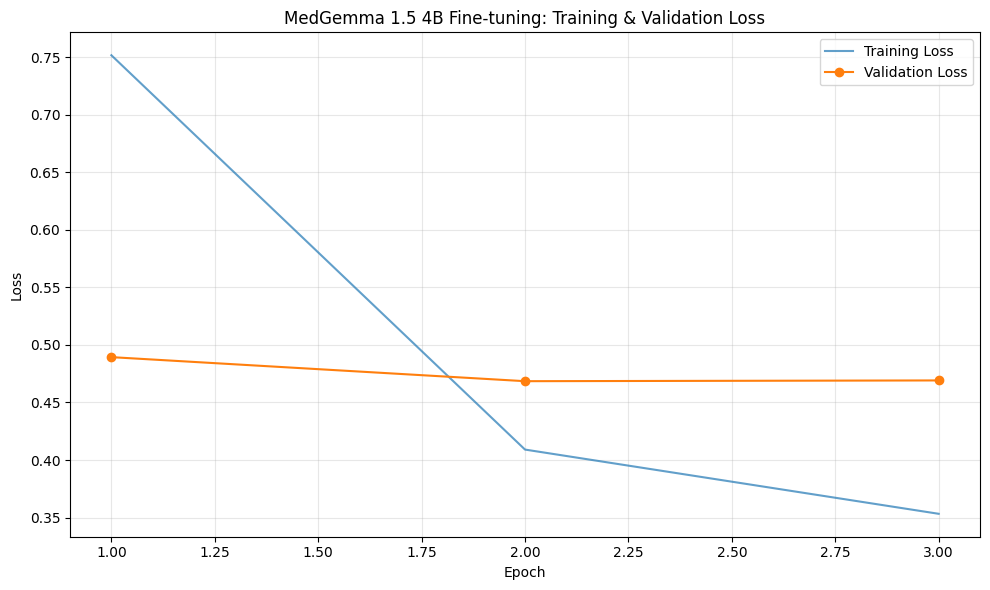

[INFO] Loss curve saved to: training_loss_curve.png


In [16]:
import matplotlib.pyplot as plt

log_history = trainer.state.log_history

train_losses = [log["loss"] for log in log_history if "loss" in log]
epoch_train = [log["epoch"] for log in log_history if "loss" in log]
eval_losses = [log["eval_loss"] for log in log_history if "eval_loss" in log]
epoch_eval = [log["epoch"] for log in log_history if "eval_loss" in log]

plt.figure(figsize=(10, 6))
plt.plot(epoch_train, train_losses, label="Training Loss", alpha=0.7)
plt.plot(epoch_eval, eval_losses, label="Validation Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("MedGemma 1.5 4B Fine-tuning: Training & Validation Loss")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

# Optional: Save figure to file for report
plt.savefig("training_loss_curve.png", dpi=150)
plt.show()
print("[INFO] Loss curve saved to: training_loss_curve.png")

Wonderful! Our training loss goes down and our validation loss goes *slightly* down. This means our model might be overfitting. We could explore this further by training different training settings, however, for now let's inspect our fine-tuned model's outputs.

## Test the fine-tuned model

How about we test it on a few samples from our validation dataset?

Notably, our model has never seen these samples before so the performance on these will be a good indicator to how our model will perform on new unseen samples.

[INFO] FINE-TUNED MODEL INFERENCE (after training)

[INFO] Testing on 5 validation samples:




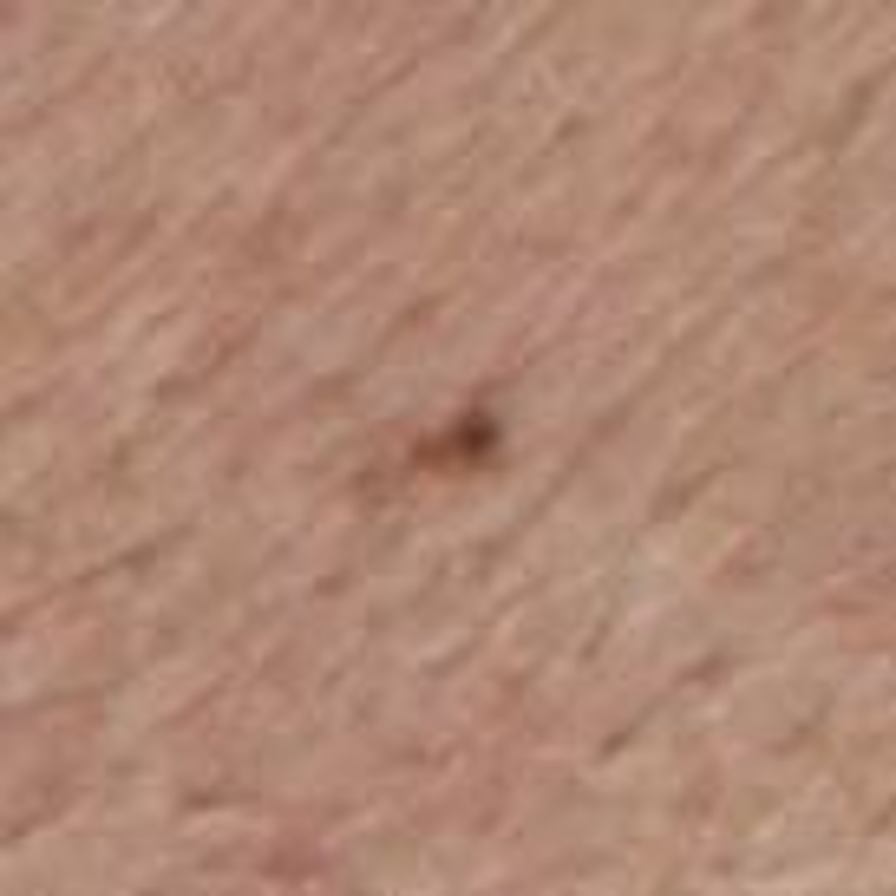


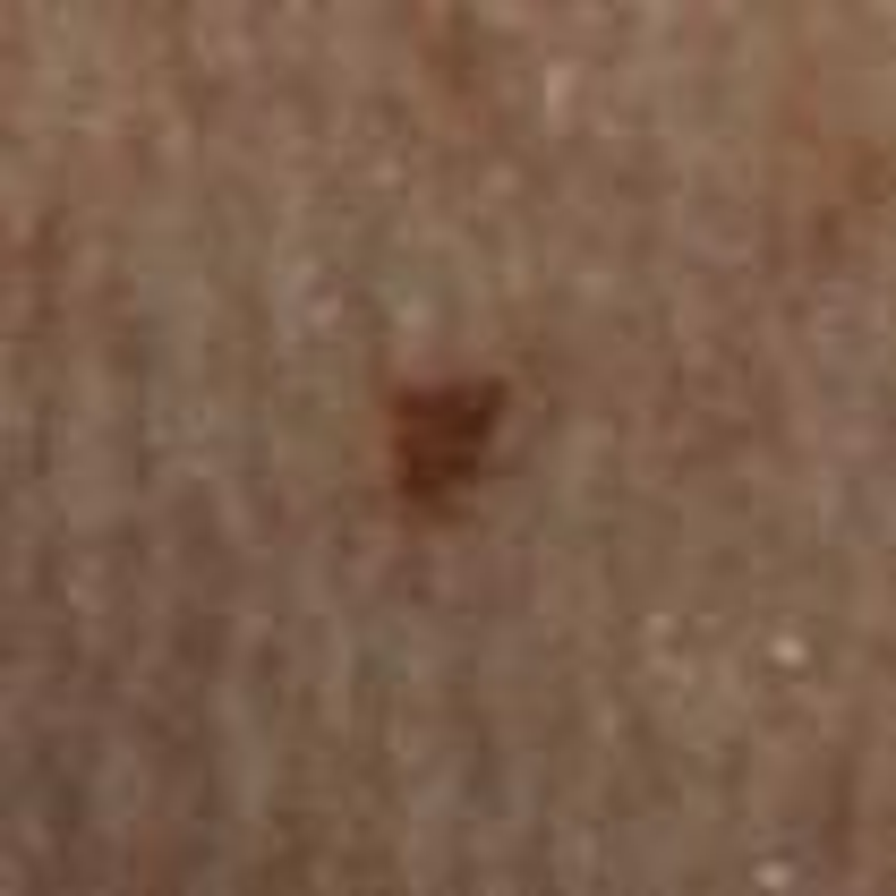


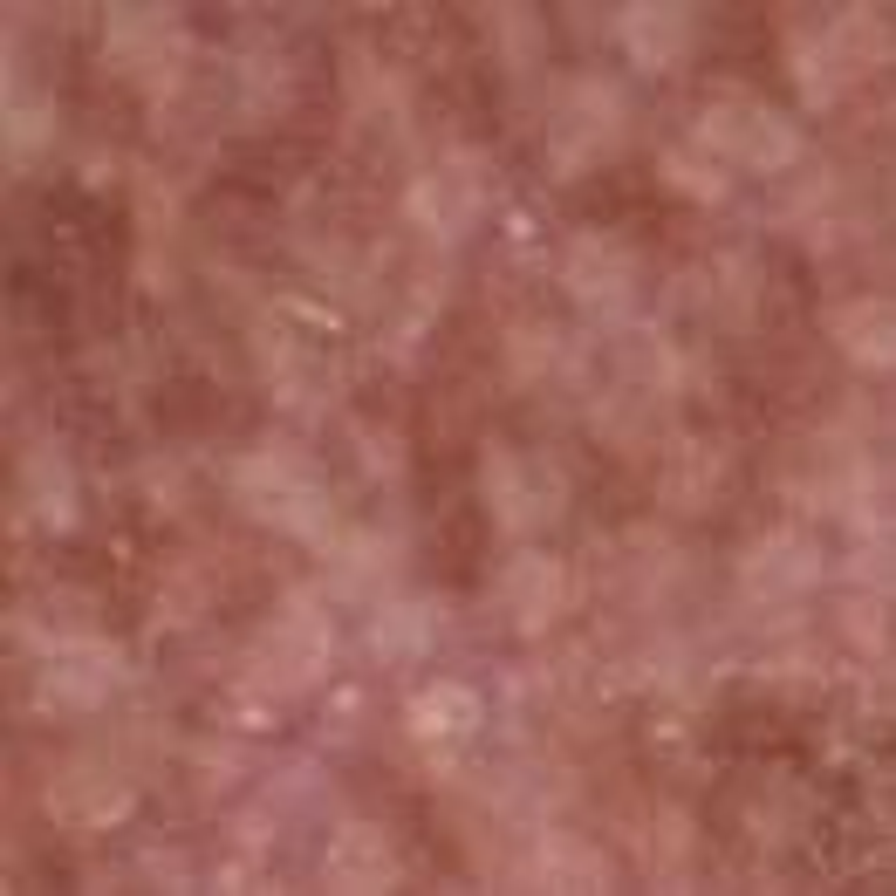


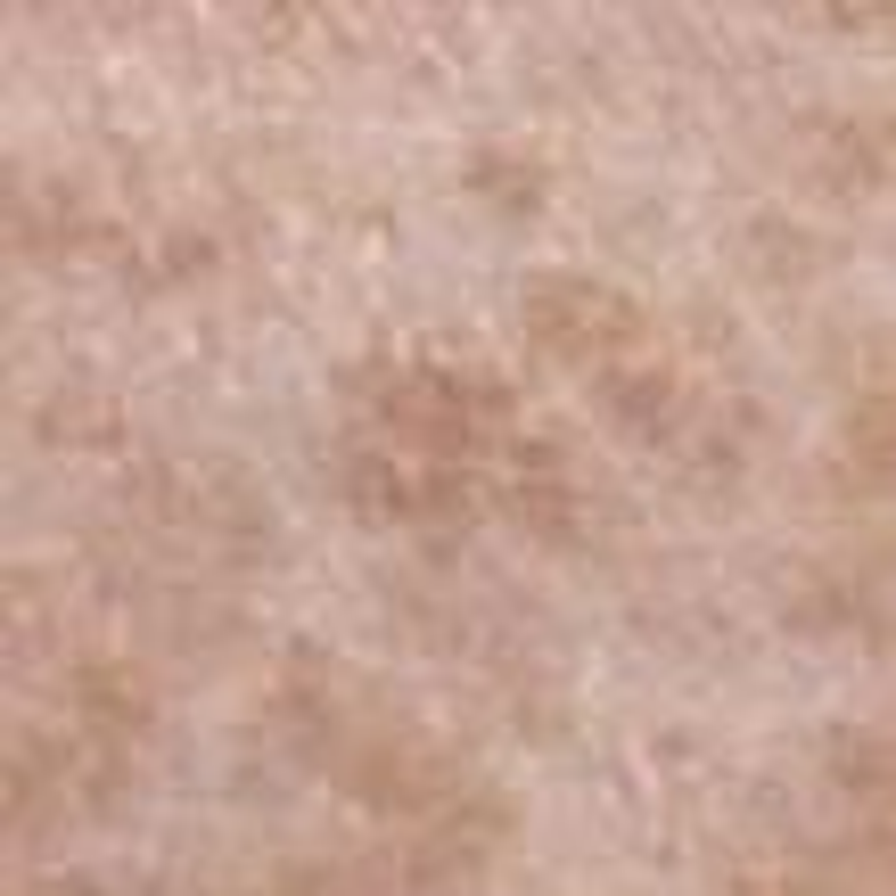


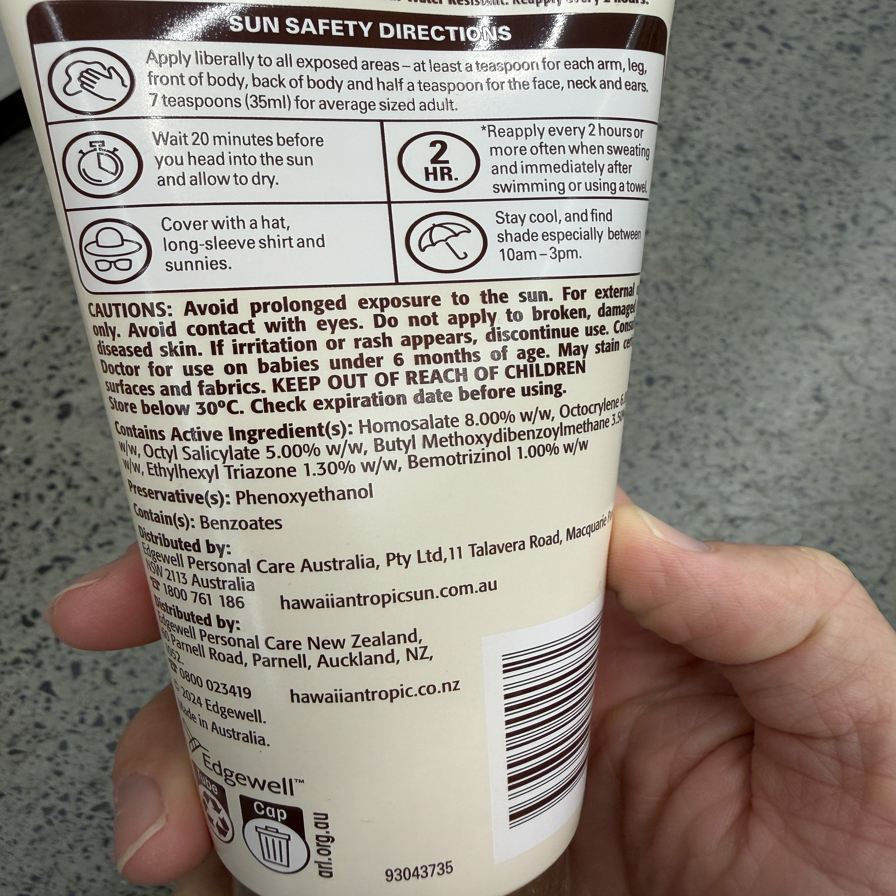

In [17]:
from IPython.display import display, HTML

import json
import base64
import time

from io import BytesIO

def display_html_comparison_card(prompt: str, image, predicted: str, expected: str, sample_num: int = None, inference_time: float = None):
    """Display an HTML comparison card in a Jupyter Notebook.

    Args:
        prompt: The text prompt input.
        image: A PIL Image object.
        predicted: The predicted output string (JSON or plain text).
        expected: The expected/desired output string (JSON or plain text).
        sample_num: Optional sample number for the card title.
        inference_time: Optional inference time in seconds.
    """
    buf = BytesIO()
    image.save(buf, format="PNG")
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    def fmt(text):
        try:
            obj = json.loads(text)
            return json.dumps(obj, indent=2)
        except (json.JSONDecodeError, TypeError):
            return str(text)

    predicted_fmt = fmt(predicted)
    expected_fmt = fmt(expected)

    title = f"Sample {sample_num}" if sample_num else "Comparison"
    time_html = f'<span style="font-size:13px; color:#555; font-weight:normal; margin-left:12px;">Inference: {inference_time:.2f}s</span>' if inference_time is not None else ""

    html = f"""
    <div style="border:1px solid #ccc; padding:16px; margin:12px 0; font-family:monospace; max-width:1200px;">
        <h3 style="margin:0 0 4px 0; font-size:16px;">{title}{time_html}</h3>
        <p style="margin:0 0 12px 0; font-size:13px; color:#555;">Prompt: <strong>{prompt}</strong></p>
        <div style="text-align:center; margin-bottom:12px;">
            <img src="data:image/png;base64,{img_b64}" style="max-width:300px; border:1px solid #ddd;" />
        </div>
        <div style="display:flex; gap:16px;">
            <div style="flex:1; min-width:0;">
                <h4 style="margin:0 0 6px 0; font-size:14px;">Predicted</h4>
                <pre style="background:#f9f9f9; border:1px solid #ddd; padding:10px; font-size:12px; overflow-x:auto; white-space:pre-wrap; word-break:break-word;">{predicted_fmt}</pre>
            </div>
            <div style="flex:1; min-width:0;">
                <h4 style="margin:0 0 6px 0; font-size:14px;">Expected</h4>
                <pre style="background:#f9f9f9; border:1px solid #ddd; padding:10px; font-size:12px; overflow-x:auto; white-space:pre-wrap; word-break:break-word;">{expected_fmt}</pre>
            </div>
        </div>
    </div>
    """
    display(HTML(html))


print("[INFO] FINE-TUNED MODEL INFERENCE (after training)")
print("=" * 60)

torch.cuda.empty_cache()

num_test_samples = 5
print(f"\n[INFO] Testing on {num_test_samples} validation samples:\n")

model.eval()
for i in range(min(num_test_samples, len(val_dataset))):
    sample = val_dataset[i]

    input_messages = sample["messages"][:1]

    inputs = processor.apply_chat_template(
        input_messages,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    ).to(device)

    input_len = inputs["input_ids"].shape[-1]

    with torch.no_grad():
        t_start = time.perf_counter()
        output_ids = model.generate(
            **inputs,
            max_new_tokens=512,
            do_sample=False,
        )
        t_end = time.perf_counter()
        generated_ids = output_ids[0][input_len:]

    inference_time = t_end - t_start
    prediction = processor.decode(generated_ids, skip_special_tokens=True)
    desired = sample["messages"][-1]["content"][0]["text"]
    prompt_text = sample["messages"][0]["content"][1]["text"]
    image = sample["messages"][0]["content"][0]["image"].resize((896, 896))

    display_html_comparison_card(
        prompt=prompt_text,
        image=image,
        predicted=prediction,
        expected=desired,
        sample_num=i + 1,
        inference_time=inference_time,
    )

## Upload the fine-tuned model to Hugging Face

Now we've fine-tuned our model, we can upload it to the Hugging Face Hub so it can be re-used and accessed by others.

In [18]:
import os
import shutil
from huggingface_hub import HfApi, create_repo

# Set the Hugging Face repo name to upload to (note: you'll want to change the username here)
REPO_ID = "mrdbourke/sunny-medgemma-1.5-4b-finetune"
OUTPUT_DIR = "medgemma-1.5-4b-sunny-skin-finetune"  # Must match the OUTPUT_DIR from training

# Remove checkpoint folders to save upload time/space
for d in os.listdir(OUTPUT_DIR):
    if d.startswith("checkpoint-"):
        shutil.rmtree(os.path.join(OUTPUT_DIR, d))
        print(f"[INFO] Removed checkpoint: {d}")

# Create a private repo (or use existing)
create_repo(REPO_ID,
            repo_type="model",
            private=True,
            exist_ok=True)
print(f"[INFO] Repo ready: https://huggingface.co/{REPO_ID} (private)")

# Upload the entire model folder
api = HfApi()
api.upload_folder(
    folder_path=f"./{OUTPUT_DIR}/",
    repo_id=REPO_ID,
    repo_type="model",
)
print(f"[INFO] Model uploaded to: https://huggingface.co/{REPO_ID}")

[INFO] Removed checkpoint: checkpoint-186
[INFO] Removed checkpoint: checkpoint-124
[INFO] Repo ready: https://huggingface.co/mrdbourke/sunny-medgemma-1.5-4b-finetune (private)


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...n-finetune/tokenizer.json:  25%|##4       | 8.28MB / 33.4MB            

  ...inetune/model.safetensors:   0%|          |  112kB / 8.60GB            

  ...inetune/training_args.bin:  12%|#2        |   689B / 5.65kB            

[INFO] Model uploaded to: https://huggingface.co/mrdbourke/sunny-medgemma-1.5-4b-finetune


## Compare original model to fine-tuned model

> **Note:** You may need to restart the Google Colab Runtime if you're looking to compare the two models (the base model and the fine-tuned model), this will free up more space on the GPU to load both models simultaneously (about 25GB VRAM required).

Let's compare the original model's outputs with our samples to the fine-tuned models outputs.

To do so we'll:

1. Load the original dataset and split the `"test"` split off to predict on.
2. Load the base model and the fine-tuned model.
3. Predict on a series of random test samples and compare the outputs from the base model to the fine-tuned model.

In [19]:
import json

from datasets import load_dataset

dataset = load_dataset("mrdbourke/sunny-skin-and-sunscreen-extract-1k")
print(f"[INFO] Dataset loaded:")
print(dataset)
print(f"\n[INFO] Test features: {dataset['test'].features}")
print(f"[INFO] Number of test samples: {len(dataset['test'])}")
print(f"[INFO] Example sample keys: {list(dataset['test'][0].keys())}")

# Look at a test example
example = dataset["test"][0]
print(f"\n[INFO] Example input_prompt:\n{example['input_prompt'][:200]}")
print(f"\n[INFO] Example target output:")
json.loads(str(example['output']))

[INFO] Dataset loaded:
DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'input_prompt', 'output', 'source'],
        num_rows: 987
    })
    test: Dataset({
        features: ['image', 'image_id', 'input_prompt', 'output', 'source'],
        num_rows: 110
    })
})

[INFO] Test features: {'image': Image(mode=None, decode=True), 'image_id': Value('string'), 'input_prompt': Value('string'), 'output': Value('string'), 'source': Value('string')}
[INFO] Number of test samples: 110
[INFO] Example sample keys: ['image', 'image_id', 'input_prompt', 'output', 'source']

[INFO] Example input_prompt:
skin extract

[INFO] Example target output:


{'lesion_type': 'A small pigmented spot.',
 'color': 'Varied shades of light and dark brown.',
 'symmetry': 'Asymmetrical in shape and pigment distribution.',
 'borders': 'The edges appear irregular and ill-defined.',
 'texture': 'Undetermined due to image resolution or focus.',
 'summary': 'A small, asymmetrical pigmented spot with varied brown tones and irregular borders.'}

Let's create a couple of helper functions to load a model and preprocessor as well as predict on a given sample.

In [20]:
import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForImageTextToText


def load_model(model_id="mrdbourke/sunny-medgemma-1.5-4b-finetune"):
    """Load the fine-tuned model and processor.

    Returns:
        tuple: (model, processor)
    """
    model = AutoModelForImageTextToText.from_pretrained(
        model_id,
        dtype=torch.bfloat16,
        device_map="auto",
    )
    processor = AutoProcessor.from_pretrained(model_id)
    model.eval()
    return model, processor

def predict(
    image,
    input_prompt,
    model,
    processor,
    max_new_tokens=1024,
):
    """Run inference on a single image + prompt.

    Args:
        image: PIL.Image.Image or str (file path / URL).
        input_prompt: str, e.g. "skin extract" or "sunscreen extract".
        model: The loaded model from load_model().
        processor: The loaded processor from load_model().
        max_new_tokens: Max tokens to generate (default 1024).

    Returns:
        str: The model's generated text output.
    """
    # Handle string paths
    if isinstance(image, str):
        image = Image.open(image).convert("RGB")
    elif isinstance(image, Image.Image):
        image = image.convert("RGB")

    # Build message
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": input_prompt},
            ],
        }
    ]

    # Tokenize
    inputs = processor.apply_chat_template(
        messages,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    ).to(model.device)

    # Optional: Inspect the inputs
    # print(inputs)

    input_len = inputs["input_ids"].shape[-1]

    # Generate
    with torch.no_grad():
        output_ids = model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            do_sample=False,
        )

    generated_ids = output_ids[0][input_len:]
    return processor.decode(generated_ids, skip_special_tokens=True)

Now we can load in the base model as well as the fine-tuned model.

In [21]:
# Load base model
BASE_MODEL_ID = "google/medgemma-1.5-4b-it"
base_model, base_processor = load_model(model_id=BASE_MODEL_ID)
print(f"[INFO] Base model loaded from: {BASE_MODEL_ID}!")

# Load fine-tuned model
FINE_TUNED_MODEL_ID = "mrdbourke/sunny-medgemma-1.5-4b-finetune"
ft_model, ft_processor = load_model(model_id=FINE_TUNED_MODEL_ID)
print(f"[INFO] Fine-tuned model loaded from: {FINE_TUNED_MODEL_ID}!")

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

[INFO] Base model loaded from: google/medgemma-1.5-4b-it!


config.json:   0%|          | 0.00/2.81k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/8.60G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.53k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

[INFO] Fine-tuned model loaded from: mrdbourke/sunny-medgemma-1.5-4b-finetune!


Models loaded!

Let's now create a helper function to display different comparison outputs. We'll want to display an image alongside its different prediction outputs from different models.

In [22]:
from IPython.display import display, HTML
import json
import base64
from io import BytesIO

def compare_base_model_to_fine_tuned_outputs(
    prompt: str,
    image,
    base_output: str,
    ft_output: str,
    sample_num: int = None,
    test_idx: int = None,
    image_id: str = None,
    base_inference_time: float = None,
    ft_inference_time: float = None,
):
    """Display an HTML comparison card: base model vs fine-tuned model.

    Args:
        prompt: The text prompt input.
        image: A PIL Image object.
        base_output: The base model output string (JSON or plain text).
        ft_output: The fine-tuned model output string (JSON or plain text).
        sample_num: Optional sample number for the card title.
        test_idx: Optional index into the test dataset.
        image_id: Optional image ID from the dataset.
        base_inference_time: Optional base model inference time in seconds.
        ft_inference_time: Optional fine-tuned model inference time in seconds.
    """
    buf = BytesIO()
    image.save(buf, format="PNG")
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    def fmt(text):
        try:
            obj = json.loads(text)
            return json.dumps(obj, indent=2)
        except (json.JSONDecodeError, TypeError):
            return str(text)

    base_fmt = fmt(base_output)
    ft_fmt = fmt(ft_output)

    title = f"Sample {sample_num}" if sample_num else "Comparison"

    def time_badge(t):
        if t is None:
            return ""
        return f'<span style="font-size:11px; color:#888; margin-left:6px;">({t:.2f}s)</span>'

    meta_parts = []
    if test_idx is not None:
        meta_parts.append(f"test_idx: <strong>{test_idx}</strong>")
    if image_id is not None:
        meta_parts.append(f"image_id: <strong>{image_id}</strong>")
    meta_html = f'<p style="margin:0 0 12px 0; font-size:13px; color:#555;">{" &nbsp;|&nbsp; ".join(meta_parts)}</p>' if meta_parts else ""

    html = f"""
    <div style="border:1px solid #ccc; padding:16px; margin:12px 0; font-family:monospace; max-width:1200px;">
        <h3 style="margin:0 0 4px 0; font-size:16px;">{title}</h3>
        <p style="margin:0 0 4px 0; font-size:13px; color:#555;">Prompt: <strong>{prompt}</strong></p>
        {meta_html}
        <div style="text-align:center; margin-bottom:12px;">
            <img src="data:image/png;base64,{img_b64}" style="max-width:300px; border:1px solid #ddd;" />
        </div>
        <div style="display:flex; gap:16px;">
            <div style="flex:1; min-width:0;">
                <h4 style="margin:0 0 6px 0; font-size:14px;">Base Model{time_badge(base_inference_time)}</h4>
                <pre style="background:#f9f9f9; border:1px solid #ddd; padding:10px; font-size:12px; overflow-x:auto; white-space:pre-wrap; word-break:break-word;">{base_fmt}</pre>
            </div>
            <div style="flex:1; min-width:0;">
                <h4 style="margin:0 0 6px 0; font-size:14px;">Fine-Tuned{time_badge(ft_inference_time)}</h4>
                <pre style="background:#f9f9f9; border:1px solid #ddd; padding:10px; font-size:12px; overflow-x:auto; white-space:pre-wrap; word-break:break-word;">{ft_fmt}</pre>
            </div>
        </div>
    </div>
    """
    display(HTML(html))

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] Predicting on test image idx: 81



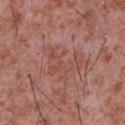

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] Predicting on test image idx: 14



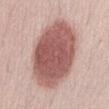

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] Predicting on test image idx: 3



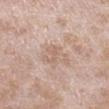

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] Predicting on test image idx: 94



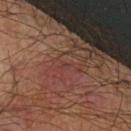

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.


[INFO] Predicting on test image idx: 35



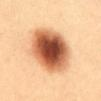

In [23]:
# Get 5 random samples from the test dataset, predict on them and show the comparison between the two outputs
import random
import time

import random
import time

test_range = list(range(len(dataset["test"])))
random_idxs = random.sample(test_range, k=5)

for i, idx in enumerate(random_idxs):
  print(f"[INFO] Predicting on test image idx: {idx}")
  test_sample = dataset["test"][idx]
  image = test_sample["image"]
  input_prompt = test_sample["input_prompt"]
  image_id = test_sample["image_id"]

  # Base model inference
  t_start = time.perf_counter()
  generated_output_base_model = predict(
      image=image,
      input_prompt=input_prompt,
      model=base_model,
      processor=base_processor,
  )
  base_time = time.perf_counter() - t_start

  # Fine-tuned model inference
  t_start = time.perf_counter()
  generated_output_ft_model = predict(
      image=image,
      input_prompt=input_prompt,
      model=ft_model,
      processor=ft_processor,
  )
  ft_time = time.perf_counter() - t_start

  # Display HTML comparison card
  compare_base_model_to_fine_tuned_outputs(
      prompt=input_prompt,
      image=image,
      base_output=generated_output_base_model,
      ft_output=generated_output_ft_model,
      sample_num=i + 1,
      test_idx=idx,
      image_id=image_id,
      base_inference_time=base_time,
      ft_inference_time=ft_time,
  )

The fine-tuned model outputs a much more reliable format comapred to the base model.

## Notes

Some notes on things discovered during the fine-tuning/evaluating process.

* More comparisons could be done with the `base_model` prompted with the original extraction prompt. However, our goal was to fine-tune this functionality directly into the model with a small prompt (e.g. `skin extract`) to save on memory usage on device.
* Model doesn't do well on images which are not rotated the correct way. For example, if a sunscreen image comes in horizontal, the model doesn't do well. This could potentially be mitigated with a rotation fix or by training the model on rotated images (data augmentation).
  * Could also potentially add a small "document orientation detection" step to feed images in the right direction (see: https://arxiv.org/html/2511.04161v1).
* For sunscreen extraction, the model tends to fail when quantized. This is likely largely due to the small number of samples seen during pretraining/fine-tuning (only ~50 samples of the back and front of sunscreen). To improve this we'd likely need to increase training data and potentially lower the amount of information extracted (this lower information extracted could also help on minimizing the number of generation steps = lower chance for error).
* More formal evals: A more formal evaluation would be to specifically design evaluation functions such as "token accuracy" (e.g. what proportion of tokens are present in the fine-tuned model output comapred to the ground truth labels). Since labels are also already generated by Gemini 3 Flash, we'd likely want to have these reviewed by a dermatologist to make sure they are on the right path. As we are ML/iOS engineers, we have defaulted to the solution most accessible to us. In turn, we have no *real* way of verifying these except to say "they kind of look correct to us". If this model was to be deployed to a real user-facing system, we would lean far more heavily into verified labels.

## Extra materials

Below are the prompts used to extract the ground truth labels we used for the training data via Gemini 3 Flash.

In [ ]:
# Original VLM extraction prompt for skin (used for Gemini 3 Flash ground truth labels)
PROMPT_VLM_SKIN_EXTRACT = """
Role: You are a specialized morphological observer for a skin-tracking application.
Task: Describe the skin lesion in the provided image using a structured, narrative format.

Guidelines:
1. No Diagnosis: Do not name conditions (e.g., avoid "melanoma" or "mole").
2. No Medical Advice: Do not provide safety assessments.
3. Language: Use Sentence Case. Ensure descriptions are readable and descriptive.
4. Objectivity: Describe only what is visually present.

Extraction Schema:
{
  "lesion_type": "Description of the type (e.g., A pigmented macule/flat).",
  "color": "Description of hues and pigment distribution.",
  "symmetry": "Description of the balance of shape and color.",
  "borders": "Description of the margins/edges.",
  "texture": "Description of the surface quality.",
  "summary": "A 1-2 sentence takeaway for the user to share with a doctor."
}

Formatting Rules:
- Return ONLY valid JSON.
- If a feature is not visible due to image quality, return "Undetermined due to image resolution or focus."
"""

# Original VLM extraction prompt for sunscreen (used for Gemini 3 Flash ground truth labels)
PROMPT_VLM_SUNSCREEN_EXTRACT = """
Role: You are a specialized dermatological data extraction agent. Your goal is to convert images of sunscreen packaging into structured JSON for a skin-health tracking app.

Task:
1. Identify Orientation: Determine if the image is "front", "back", or "other".
2. Extract Data: Capture specific fields based on the identified side.
3. Classify Formula: Based on the ingredients, classify the 'formula_type' as "Mineral", "Chemical", or "Hybrid".
4. Tag Ingredients: For each active ingredient, label it as "Mineral" or "Chemical".
5. Normalize Units: Convert all ingredient concentrations to percentages (e.g., 50mg/g = 5.0%).

Extraction Schema:
{
  "side": "front" | "back" | "other",
  "formula_type": "Mineral" | "Chemical" | "Hybrid" | "Not visible",
  "data": {
    "brand": "string",
    "product_name": "string",
    "spf": "number",
    "spectrum": "boolean",
    "water_resistance": "number (minutes)",
    "regulatory_id": "string",
    "assumed_main_ingredient": "string",
    "active_ingredients": [
      {"name": "string", "percentage": "string", "category": "Mineral" | "Chemical"}
    ],
    "preservatives": ["string"],
    "claims": ["string"],
    "application_timer": "number (minutes)",
    "storage_limit": "number (celsius)",
    "warnings": "string"
  }
}

Formatting Rules:
- Return ONLY valid JSON.
- If a field is not visible or cannot be extracted, return the string "Not visible".
- For the 'side' field, if the image is neither clearly front nor back, return "other".
"""